In [ ]:
import numpy as np
import pandas as pd
import nltk
import csv
import re
import json
from tqdm import tqdm

In [ ]:
data = []

with open("/content/bsummaries/booksummaries.txt", 'r') as f:
    reader = csv.reader(f, dialect='excel-tab')
    for row in tqdm(reader):
        data.append(row)

16559it [00:00, 19149.84it/s]


In [ ]:
book_id = []
book_name = []
summary = []
genre = []

for i in tqdm(data):
    book_id.append(i[0])
    book_name.append(i[2])
    genre.append(i[5])
    summary.append(i[6])

books = pd.DataFrame({'book_id': book_id, 'book_name': book_name,
                       'genre': genre, 'summary': summary})
books.head(2)

100%|██████████| 16559/16559 [00:00<00:00, 613758.10it/s]


,book_id,book_name,genre,summary
0,620,Animal Farm,"{""/m/016lj8"": ""Roman \u00e0 clef"", ""/m/06nbt"":...","Old Major, the old boar on the Manor Farm, ca..."
1,843,A Clockwork Orange,"{""/m/06n90"": ""Science Fiction"", ""/m/0l67h"": ""N...","Alex, a teenager living in near-future Englan..."


In [ ]:
books.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16559 entries, 0 to 16558
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   book_id    16559 non-null  object
 1   book_name  16559 non-null  object
 2   genre      16559 non-null  object
 3   summary    16559 non-null  object
dtypes: object(4)
memory usage: 517.6+ KB


In [ ]:


books.drop(books[books['genre']==''].index, inplace=True)
books[books['genre']=='']



,book_id,book_name,genre,summary


In [ ]:


json.loads(books['genre'][0]).values()



dict_values(['Roman à clef', 'Satire', "Children's literature", 'Speculative fiction', 'Fiction'])

In [ ]:


genres = []
for i in books['genre']:
    genres.append(list(json.loads(i).values()))
books['genre_new'] = genres



In [ ]:


all_genres = sum(genres,[])
len(set(all_genres))



227

In [ ]:
def clean_summary(text):
    text = re.sub("\'", "", text)
    text = re.sub("[^a-zA-Z]"," ",text)
    text = ' '.join(text.split())
    text = text.lower()
    return text

In [ ]:
books['clean_summary'] = books['summary'].apply(lambda x: clean_summary(x))
books.head(2)

,book_id,book_name,genre,summary,genre_new,clean_summary
0,620,Animal Farm,"{""/m/016lj8"": ""Roman \u00e0 clef"", ""/m/06nbt"":...","Old Major, the old boar on the Manor Farm, ca...","[Roman à clef, Satire, Children's literature, ...",old major the old boar on the manor farm calls...
1,843,A Clockwork Orange,"{""/m/06n90"": ""Science Fiction"", ""/m/0l67h"": ""N...","Alex, a teenager living in near-future Englan...","[Science Fiction, Novella, Speculative fiction...",alex a teenager living in near future england ...


In [ ]:
# Import the SnowballStemmer to perform stemming
from nltk.stem.snowball import SnowballStemmer

# Create an English language SnowballStemmer object
stemmer = SnowballStemmer("english")

def tokenize_and_stem(text):
    
    # Tokenize by sentence, then by word
    tokens = [word for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent)]
    
    # Filter out raw tokens to remove noise
    filtered_tokens = [token for token in tokens if re.search('[a-zA-Z]', token)]
    
    # Stem the filtered_tokens
    stems = [stemmer.stem(token) for token in filtered_tokens]
    
    return stems

In [ ]:

# Import TfidfVectorizer to create TF-IDF vectors
from sklearn.feature_extraction.text import TfidfVectorizer

# Instantiate TfidfVectorizer object with stopwords and tokenizer
# parameters for efficient processing of text
tfidf_vectorizer = TfidfVectorizer(max_df=0.8, max_features=200000,
                                 min_df=0.2, 
                                 #stop_words='english',
                                 use_idf=True, tokenizer=tokenize_and_stem,
                                 ngram_range=(1,3))


In [ ]:


from nltk.corpus import stopwords
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))
def remove_stopwords(text):
    no_stopword_text = [w for w in text.split() if not w in stop_words]
    return ' '.join(no_stopword_text)

books['clean_summary'] = books['clean_summary'].apply(lambda x: remove_stopwords(x))



[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:


# Fit and transform the tfidf_vectorizer with the "summary" of each book
# to create a vector representation of the summaries
nltk.download('punkt')
tfidf_matrix = tfidf_vectorizer.fit_transform([x for x in books["clean_summary"]])

print(tfidf_matrix.shape)



     


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


(12841, 78)


In [ ]:
# Import k-means to perform clusters
from sklearn.cluster import KMeans

# Create a KMeans object with 5 clusters and save as km
km = KMeans(n_clusters=25)

# Fit the k-means object with tfidf_matrix
km.fit(tfidf_matrix)

clusters = km.labels_.tolist()

# Create a column cluster to denote the generated cluster for each book
books["cluster"] = clusters

# Display number of films per cluster (clusters from 0 to 4)
books['cluster'].value_counts() 


7     1088
24     980
22     658
20     630
12     581
14     577
17     575
15     569
1      552
6      538
21     504
11     468
2      446
0      445
9      444
8      444
3      431
19     427
10     396
5      388
13     379
18     347
4      339
23     334
16     301
Name: cluster, dtype: int64

In [ ]:


# Import cosine_similarity to calculate similarity of book summaries 
from sklearn.metrics.pairwise import cosine_similarity

# Calculate the similarity distance
similarity_distance = 1 - cosine_similarity(tfidf_matrix)


In [ ]:


# Import matplotlib.pyplot for plotting graphs
import matplotlib.pyplot as plt

# Configure matplotlib to display the output inline
%matplotlib inline

# Import modules necessary to plot dendrogram
from scipy.cluster.hierarchy import linkage, dendrogram



     


In [ ]:
# Create mergings matrix 
mergings = linkage(similarity_distance, method='complete')

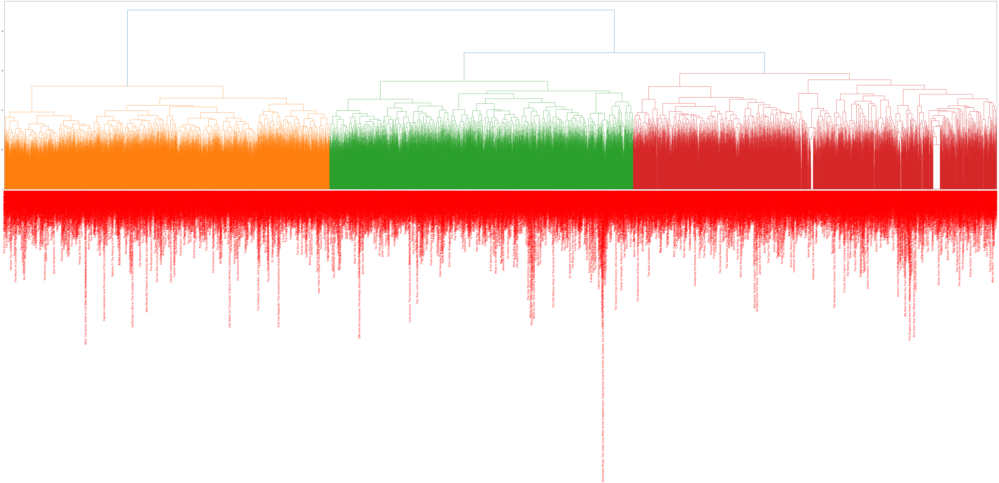

In [ ]:


# Create mergings matrix 
mergings = linkage(similarity_distance, method='complete')





     


In [ ]:
book_labels = [x for x in books["book_name"]]

In [ ]:
# Plot the dendrogram, using title as label column
dendrogram_ = dendrogram(mergings,
               labels=book_labels,
               leaf_rotation=0,
               leaf_font_size=8,
)

# Adjust the plot
fig = plt.gcf()
_ = [lbl.set_color('r') for lbl in plt.gca().get_xmajorticklabels()]
fig.set_size_inches(150, 910)

# Show the plotted dendrogram
plt.show()

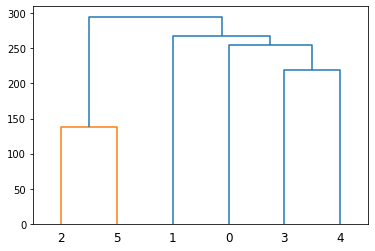

In [ ]:


ytdist = np.array([662., 877., 255., 412., 996., 295., 468., 268.,

                   400., 754., 564., 138., 219., 869., 669.])

Z = linkage(ytdist, 'single')

plt.figure()

dn = dendrogram(Z)

In [ ]:
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt
import numpy as np

hierarchy.set_link_color_palette(['m', 'c', 'y', 'k'])

fig, axes = plt.subplots(1, 1, figsize=(910, 35))

dendrogram_ = dendrogram(mergings,
               labels=book_labels,
               ax=axes
)


hierarchy.set_link_color_palette(None)  # reset to default after use

plt.show()